# 11 Klusters 2d

Calculando Elbow y Silhouette: 100%|████████████████████████████████████████████████████████████████████████████████████████| 15/15 [06:34<00:00, 26.31s/it]


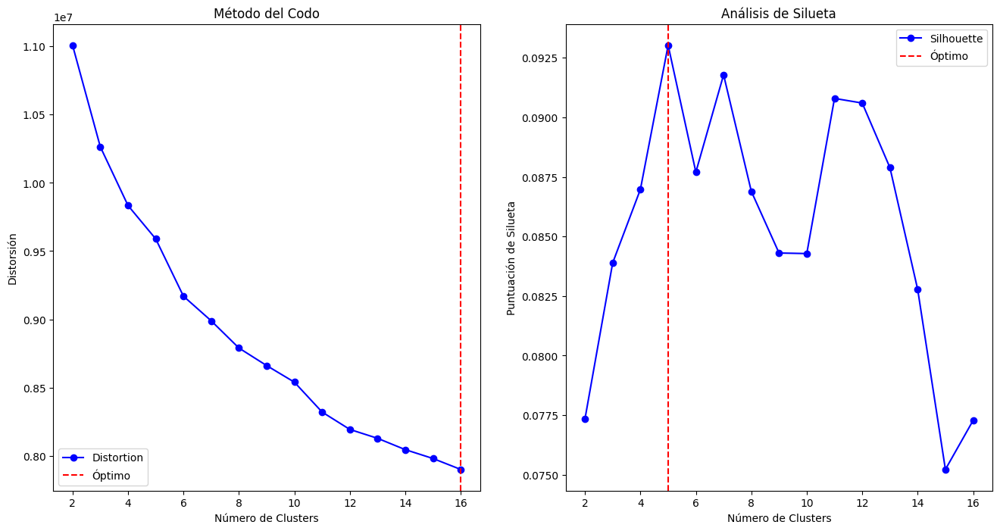

/home/fbaquero/.local/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


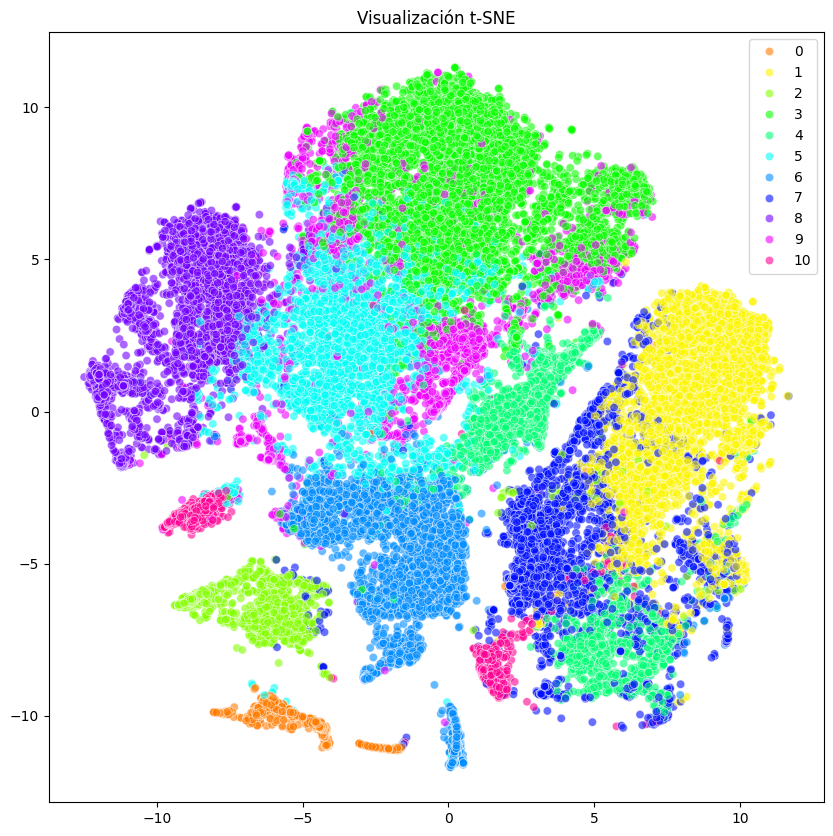

NameError: name 'plot_bic_aic' is not defined

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.manifold import TSNE
from sklearn.mixture import GaussianMixture
from tqdm import tqdm
import json
import jsonlines

# Configuración de rutas
features_file = '/home/fbaquero/tesis/tesisfinal/nodistorcion.jsonl'

# Leer las características del archivo JSONL
features = []
with jsonlines.open(features_file) as reader:
    for obj in reader:
        for detection in obj['detectors']['megadetectorV5']['output']['detections']:
            if 'features' in detection:
                features.append(detection['features'])

features = np.array(features)

# Método del Codo y Análisis de Silueta
def plot_elbow_silhouette(data, max_clusters=16):
    distortions = []
    silhouettes = []
    K = range(2, max_clusters + 1)
    
    for k in tqdm(K, desc="Calculando Elbow y Silhouette"):
        kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
        kmeans.fit(data)
        distortions.append(kmeans.inertia_)
        silhouette_avg = silhouette_score(data, kmeans.labels_)
        silhouettes.append(silhouette_avg)
    
    # Método del Codo
    plt.figure(figsize=(16, 8))
    plt.subplot(1, 2, 1)
    plt.plot(K, distortions, 'bo-', label='Distortion')
    plt.xlabel('Número de Clusters')
    plt.ylabel('Distorsión')
    plt.title('Método del Codo')
    plt.axvline(x=K[np.argmin(distortions)], color='r', linestyle='--', label='Óptimo')
    plt.legend()

    # Análisis de Silueta
    plt.subplot(1, 2, 2)
    plt.plot(K, silhouettes, 'bo-', label='Silhouette')
    plt.xlabel('Número de Clusters')
    plt.ylabel('Puntuación de Silueta')
    plt.title('Análisis de Silueta')
    plt.axvline(x=K[np.argmax(silhouettes)], color='r', linestyle='--', label='Óptimo')
    plt.legend()
    
    plt.show()

# Visualización t-SNE
def plot_tsne(data, labels):
    tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=300)
    tsne_results = tsne.fit_transform(data)
    
    plt.figure(figsize=(10, 10))
    sns.scatterplot(
        x=tsne_results[:,0], y=tsne_results[:,1], 
        hue=labels,
        palette=sns.color_palette("hsv", len(np.unique(labels))),
        legend="full",
        alpha=0.6
    ).set_title('Visualización t-SNE')
    plt.show()


# Ejecutar los análisis y visualizaciones
plot_elbow_silhouette(features)
optimal_clusters = 8 # Cambia esto al número óptimo basado en los gráficos anteriores

kmeans = KMeans(n_clusters=optimal_clusters, random_state=42, n_init='auto')
labels = kmeans.fit_predict(features)
plot_tsne(features, labels)



# 11 Klusters 3d

In [1]:
################################################Aqui Empieza el análisis parte 2####################################

In [2]:
#Tsne 40% de datos por kluster para visualizacion tsne de 7 y 10 klusters 

In [ ]:
######Codigo que guarda imagenes en carpetas para visualizar klusters############

In [6]:
import os
import shutil
import numpy as np
from sklearn.cluster import KMeans
import jsonlines
from PIL import Image
import random
from tqdm import tqdm

# Configuración de rutas
features_file = '/home/fbaquero/tesis/tesisfinal/nodistorcion.jsonl'
root_dir = '/media/databases/tiputini/'
output_dir = '/home/fbaquero/kmeansdivision/'

# Función para eliminar y recrear directorios
def recreate_directory(dir_path):
    if os.path.exists(dir_path):
        shutil.rmtree(dir_path)
    os.makedirs(dir_path)

# Crear el directorio base para guardar las imágenes de los clusters
recreate_directory(output_dir)

# Leer las características del archivo JSONL
features = []
image_paths = []
bboxes = []
with jsonlines.open(features_file) as reader:
    for obj in tqdm(reader, desc="Leyendo características"):
        for detection in obj['detectors']['megadetectorV5']['output']['detections']:
            if 'features' in detection:
                features.append(detection['features'])
                image_paths.append(os.path.join(root_dir, obj['paths'][0]))
                bboxes.append(detection['bbox'][0])

features = np.array(features)

# Función para recortar la imagen usando las coordenadas del cropbox
def crop_image(image, bbox):
    left, top, right, bottom = bbox
    width = right - left
    height = bottom - top
    side_length = max(width, height)
    
    # Expandir el bounding box para que sea cuadrado, centrado en el objeto
    left = left - (side_length - width) // 2
    right = right + (side_length - width) // 2
    top = top - (side_length - height) // 2
    bottom = bottom + (side_length - height) // 2

    # Ajustar los límites para asegurarse de que están dentro de los bordes de la imagen
    left = max(left, 0)
    top = max(top, 0)
    right = min(right, image.width)
    bottom = min(bottom, image.height)

    cropped_image = image.crop((left, top, right, bottom))
    
    return cropped_image

# Ejecutar KMeans con 22 clusters
optimal_clusters = 11
kmeans = KMeans(n_clusters=optimal_clusters, random_state=42, init='k-means++', n_init='auto')
labels = kmeans.fit_predict(features)

# Crear subcarpetas para cada cluster y guardar las imágenes
for cluster in tqdm(range(optimal_clusters), desc="Procesando clusters"):
    cluster_dir = os.path.join(output_dir, f'cluster{cluster + 1}')
    recreate_directory(cluster_dir)
    
    cluster_indices = [i for i, label in enumerate(labels) if label == cluster]
    selected_indices = random.sample(cluster_indices, min(len(cluster_indices), 30))
    
    for i, index in enumerate(selected_indices):
        image = Image.open(image_paths[index])
        cropped_image = crop_image(image, bboxes[index])
        
        # Guardar la imagen en la carpeta del cluster correspondiente
        image_save_path = os.path.join(cluster_dir, f'image_{i + 1}.jpg')
        cropped_image.save(image_save_path)

print(f"Las imágenes se han guardado en sus respectivos directorios dentro de '{output_dir}'")


Leyendo características: 97406it [00:25, 3786.24it/s]
Procesando clusters: 100%|██████████████████████████████████████████████████████████████| 11/11 [00:06<00:00,  1.79it/s]

Las imágenes se han guardado en sus respectivos directorios dentro de '/home/fbaquero/kmeansdivision/'


In [1]:
###### ORIGINALMENTE 15 KLUSTERS PARECEN ACERTADOS######### HAY QUE PROBAR 25

/home/fbaquero/.local/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


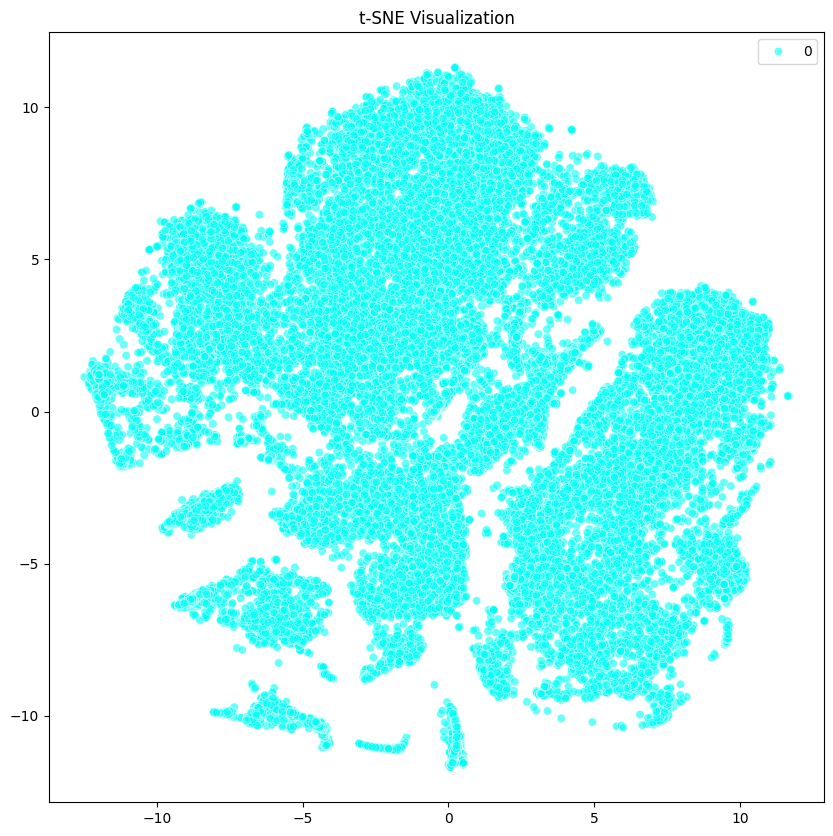

/home/fbaquero/.local/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


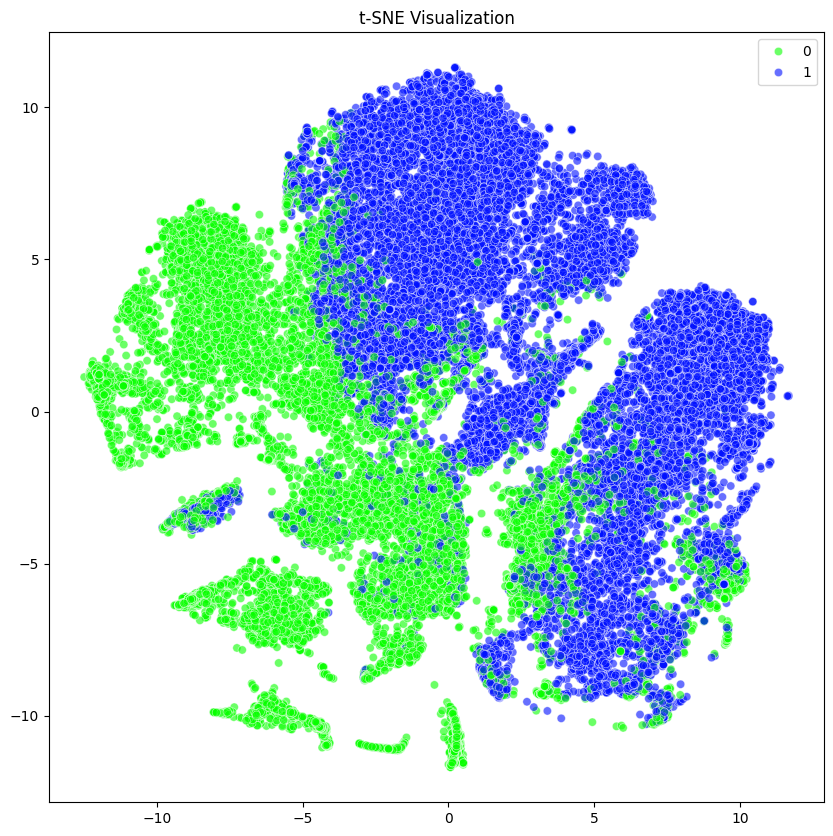

/home/fbaquero/.local/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


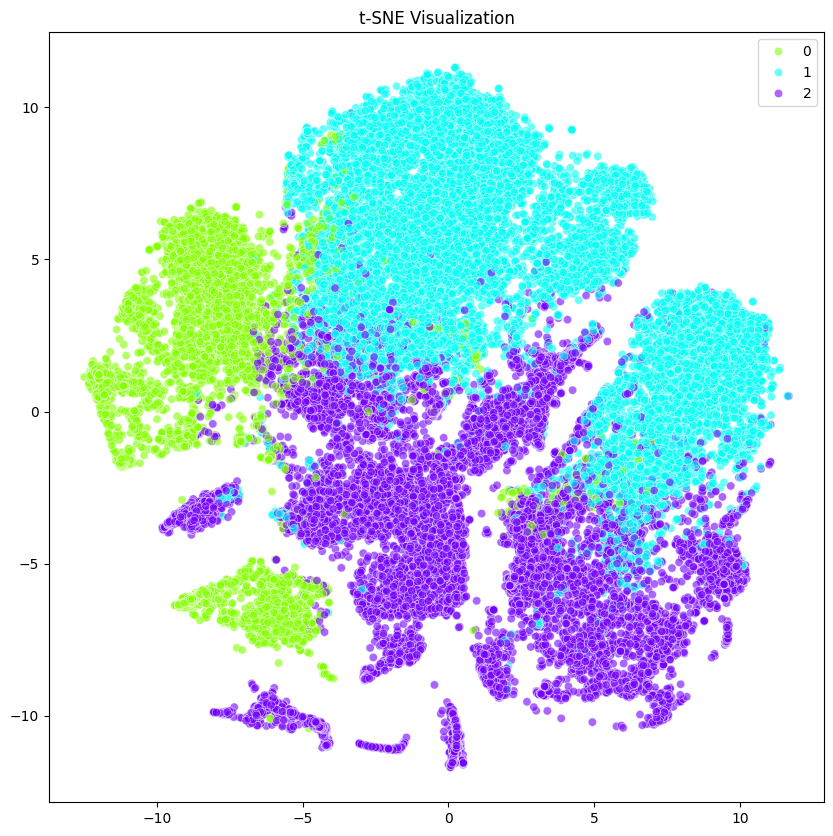

/home/fbaquero/.local/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


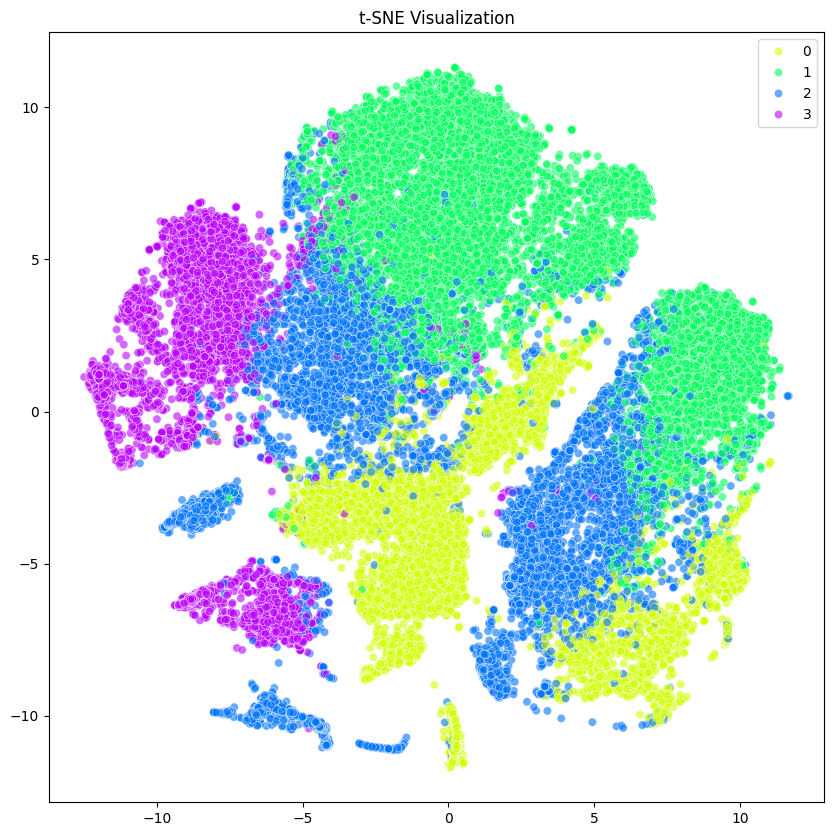

/home/fbaquero/.local/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


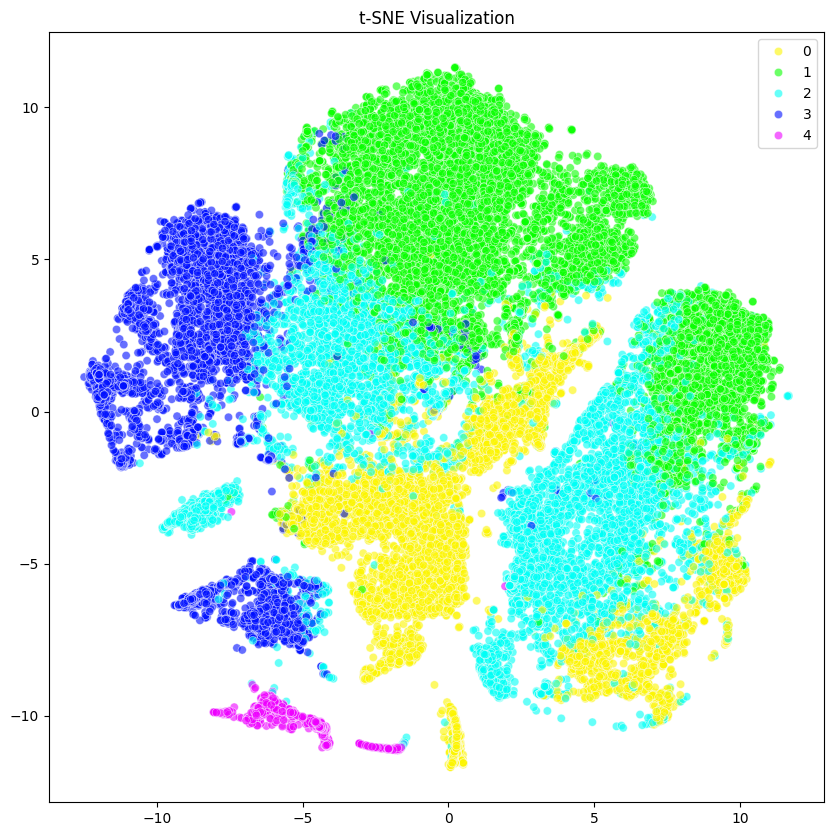

/home/fbaquero/.local/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


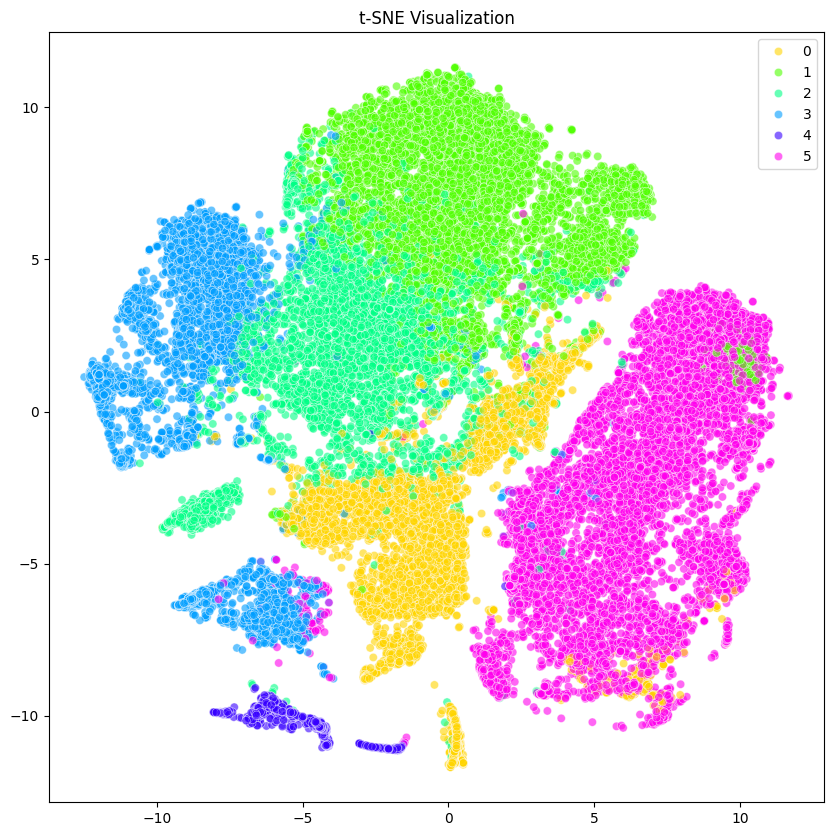

/home/fbaquero/.local/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


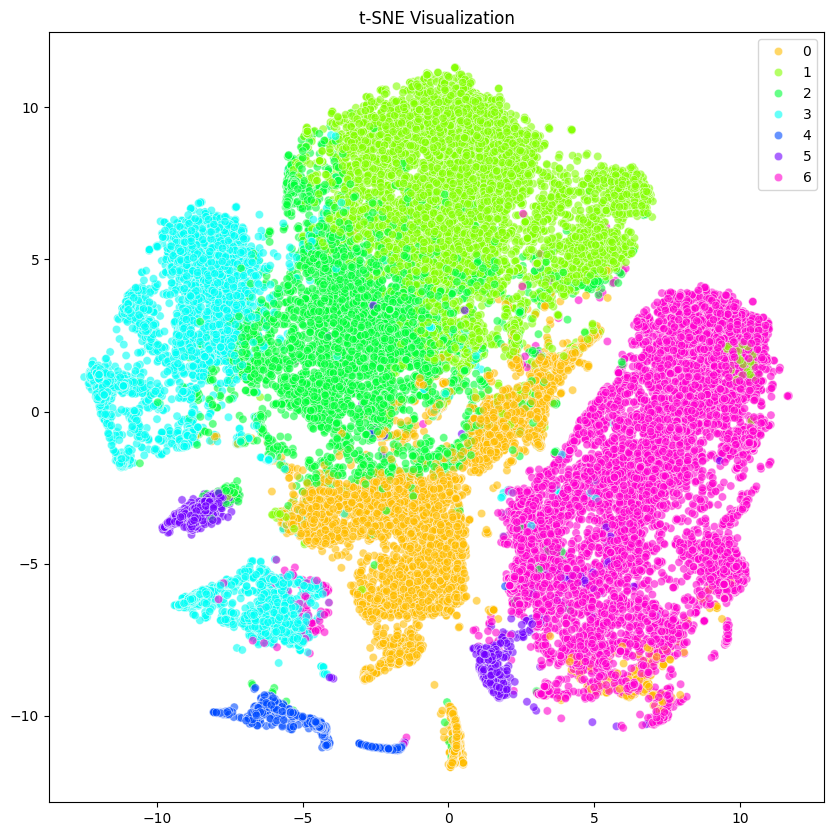

/home/fbaquero/.local/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


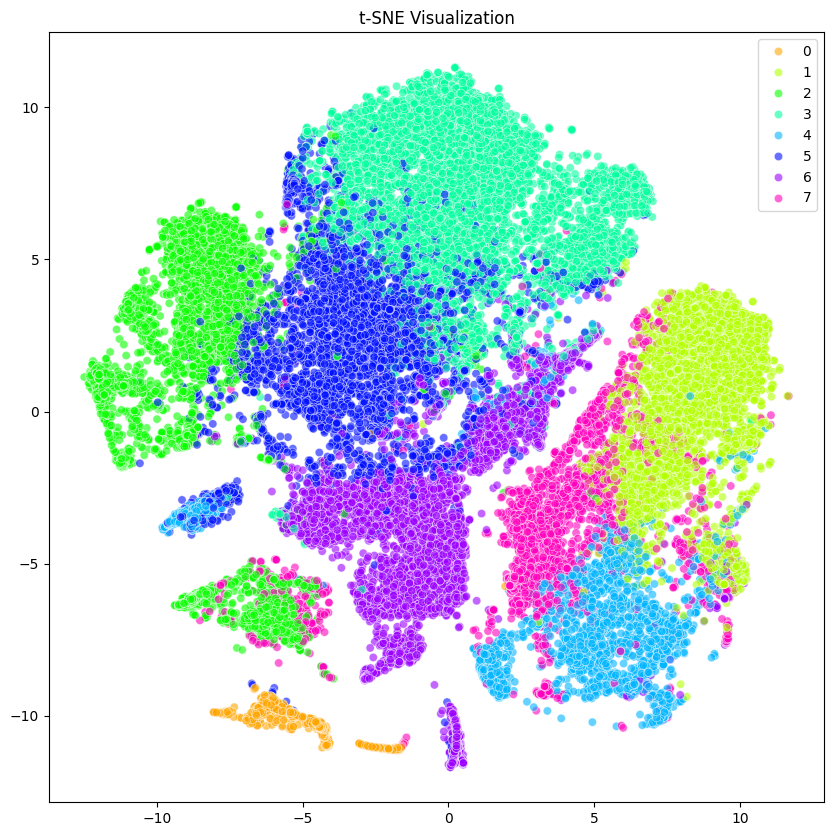

/home/fbaquero/.local/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


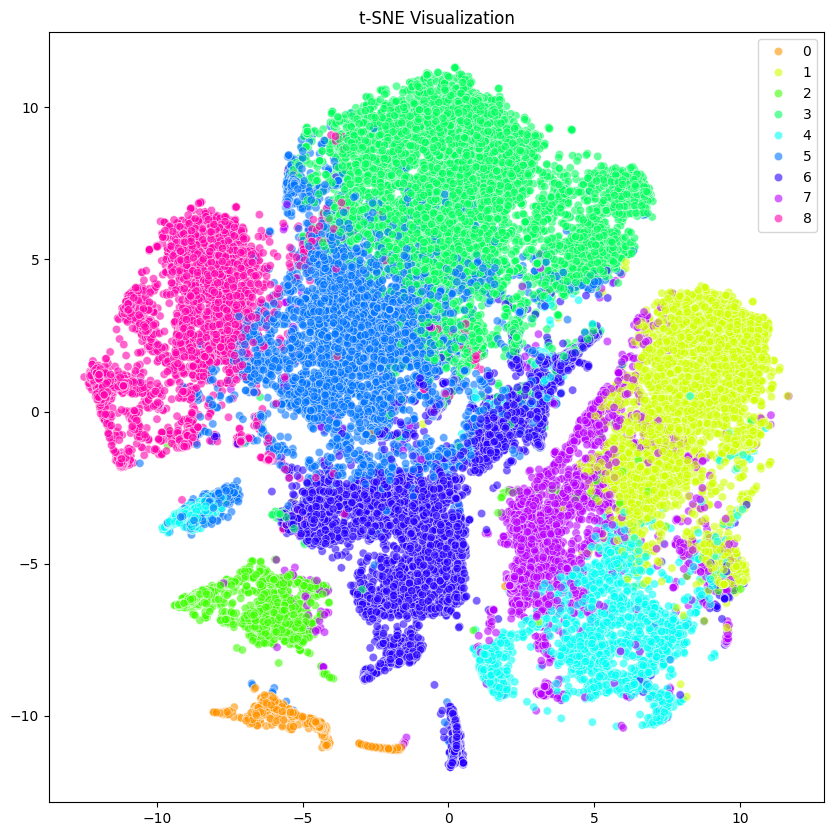

/home/fbaquero/.local/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


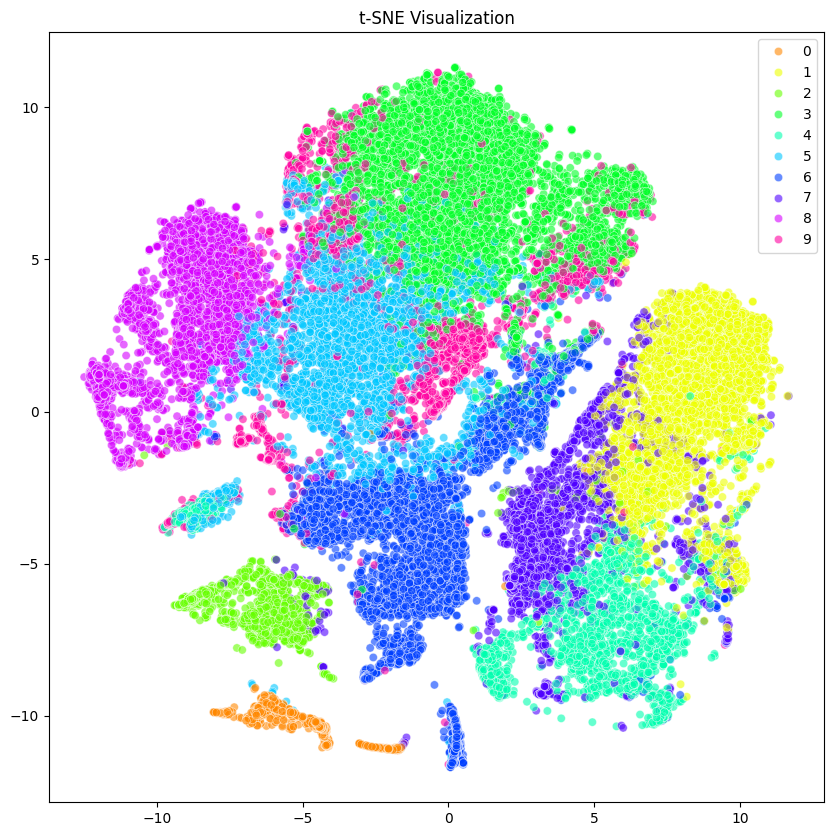

/home/fbaquero/.local/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


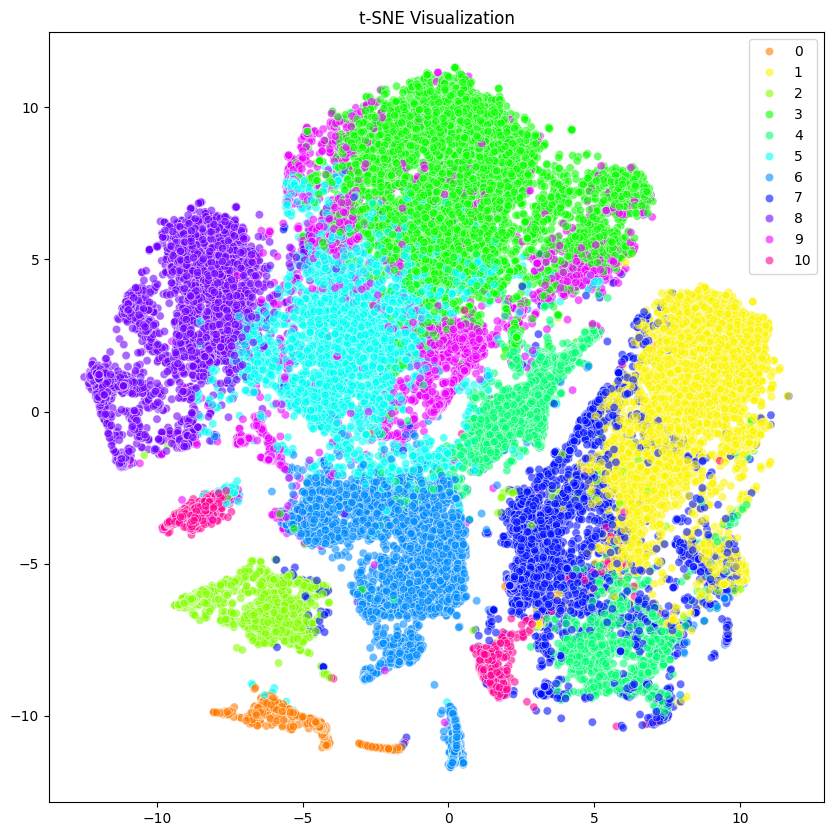

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
import jsonlines

# Configuration of paths
features_file = '/home/fbaquero/tesis/tesisfinal/nodistorcion.jsonl'

# Read features from the JSONL file
features = []
with jsonlines.open(features_file) as reader:
    for obj in reader:
        for detection in obj['detectors']['megadetectorV5']['output']['detections']:
            if 'features' in detection:
                features.append(detection['features'])

features = np.array(features)

# K-Means clustering for t-SNE visualization
def plot_tsne(data, num_clusters):
    kmeans = KMeans(n_clusters=num_clusters, random_state=42, n_init='auto')
    labels = kmeans.fit_predict(data)

    tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=300)
    tsne_results = tsne.fit_transform(data)
    
    plt.figure(figsize=(10, 10))
    sns.scatterplot(
        x=tsne_results[:,0], y=tsne_results[:,1], 
        hue=labels,
        palette=sns.color_palette("hsv", num_clusters),
        legend="full",
        alpha=0.6
    ).set_title('t-SNE Visualization')
    plt.show()

# Execute the analysis and visualization
# Specify the number of clusters you want to explore, you can change it as needed.
for i in range(1, 12):  # This will plot t-SNE for clusters from 1 to 11
    plot_tsne(features, i)
